In [3]:
import os
import numpy as np
import pandas as pd
import xpress as xp
import matplotlib.pyplot as plt

from tqdm import tqdm
from PIL import Image

In [5]:
data_path = 'Data/FICO_case_HTW2025'
data_size = '100'
cleaned = True

clean = '_cleaned' if cleaned else ''

In [6]:
df_info = pd.read_csv(f'{data_path}/data{data_size}/shares{data_size}{clean}.csv', index_col='Stock')
df_price = pd.read_csv(f'{data_path}/data{data_size}/stockprices{data_size}{clean}.csv', index_col='Stock')

df_info = df_info.loc[:, ~df_info.columns.str.contains('^Unnamed')]
df_price = df_price.loc[:, ~df_price.columns.str.contains('^Unnamed')]
df_price = df_price.astype(float)

### Delete stocks with missing ESG scores ###
missing_data_stocks = df_info[df_info.isna().any(axis=1)].index
df_info = df_info.drop(missing_data_stocks)
df_price = df_price.drop(missing_data_stocks)


df_return = np.log(df_price.T / df_price.T.shift(1)).dropna().T
df_cov = df_return.T.cov()

display(df_info)
display(df_price)
display(df_return)
display(df_cov)

,Return,Sector,ESG score
Stock,,,
Stock_1,0.1598,Healthcare,73.0
Stock_2,0.2018,Technology,95.0
Stock_3,0.0883,Consumer Goods,63.0
Stock_4,0.2048,Finance,68.0
Stock_5,0.0818,Finance,65.0
...,...,...,...
Stock_96,0.0687,Energy,63.0
Stock_97,0.1150,Energy,31.0
Stock_98,0.0552,Real Estate,59.0


,Day_129,Day_154,Day_155,Day_178,Day_179,Day_181,Day_182,Day_253,Day_287,Day_288,...,Day_4991,Day_4992,Day_4993,Day_4994,Day_4995,Day_4996,Day_4997,Day_4998,Day_4999,Day_5000
Stock,,,,,,,,,,,,,,,,,,,,,
Stock_1,25.40,39.08,42.69,63.40,63.89,57.05,52.95,149.55,168.13,179.45,...,1.48,1.46,1.31,1.21,1.14,1.26,1.38,1.35,1.48,1.46
Stock_2,71.93,77.11,76.09,27.89,26.35,23.45,29.64,21.83,33.85,33.01,...,1.08,1.19,1.07,1.02,1.00,1.02,1.21,1.07,1.23,1.08
Stock_3,71.17,51.04,51.68,61.31,59.67,63.18,60.90,57.83,61.04,62.01,...,44.84,41.68,40.69,37.08,35.58,36.29,36.54,36.58,38.14,37.16
Stock_4,30.41,65.30,61.17,87.41,90.10,100.85,105.48,39.73,28.94,25.52,...,2.68,2.41,2.51,2.67,2.82,3.05,3.33,2.82,2.91,2.80
Stock_5,114.56,79.68,79.84,67.46,66.45,68.04,62.80,52.02,59.02,56.95,...,1.45,1.51,1.43,1.44,1.36,1.37,1.40,1.43,1.38,1.27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Stock_96,34.53,42.00,44.25,47.07,45.93,45.43,44.32,27.28,27.52,28.66,...,6.19,6.14,5.69,5.82,5.65,5.49,5.35,5.31,5.12,5.26
Stock_97,114.84,146.96,156.32,180.06,180.91,189.87,196.92,273.91,256.72,240.35,...,448.23,442.85,433.06,442.37,458.05,438.63,433.70,430.45,452.31,458.16
Stock_98,85.75,25.38,27.00,19.86,17.34,18.25,20.89,17.25,19.38,16.25,...,1.02,1.00,1.00,1.19,1.18,1.44,1.38,1.40,1.47,1.72


,Day_154,Day_155,Day_178,Day_179,Day_181,Day_182,Day_253,Day_287,Day_288,Day_289,...,Day_4991,Day_4992,Day_4993,Day_4994,Day_4995,Day_4996,Day_4997,Day_4998,Day_4999,Day_5000
Stock,,,,,,,,,,,,,,,,,,,,,
Stock_1,0.430862,0.088354,0.395499,0.007699,-0.113235,-0.074580,1.038283,0.117107,0.065159,-0.034988,...,0.041385,-0.013606,-0.108409,-0.079407,-0.059592,0.100083,0.090972,-0.021979,0.091937,-0.013606
Stock_2,0.069540,-0.013316,-1.003649,-0.056800,-0.116598,0.234254,-0.305840,0.438654,-0.025128,0.012942,...,0.076961,0.096992,-0.106295,-0.047856,-0.019803,0.019803,0.170818,-0.122962,0.139356,-0.130053
Stock_3,-0.332462,0.012461,0.170872,-0.027114,0.057158,-0.036755,-0.051726,0.054022,0.015766,0.005147,...,-0.046196,-0.073079,-0.024039,-0.092905,-0.041294,0.019759,0.006865,0.001094,0.041762,-0.026031
Stock_4,0.764221,-0.065335,0.356953,0.030310,0.112714,0.044887,-0.976415,-0.316882,-0.125762,-0.027813,...,-0.109457,-0.106190,0.040656,0.061796,0.054658,0.078405,0.087831,-0.166235,0.031416,-0.038534
Stock_5,-0.363080,0.002006,-0.168490,-0.015085,0.023646,-0.080141,-0.188327,0.126248,-0.035703,0.044811,...,-0.006873,0.040546,-0.054435,0.006969,-0.057158,0.007326,0.021661,0.021202,-0.035591,-0.083067
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Stock_96,0.195841,0.052186,0.061780,-0.024517,-0.010946,-0.024737,-0.485282,0.008759,0.040589,-0.034792,...,0.014646,-0.008110,-0.076114,0.022590,-0.029645,-0.028727,-0.025832,-0.007505,-0.036437,0.026977
Stock_97,0.246621,0.061745,0.141385,0.004710,0.048340,0.036458,0.330002,-0.064814,-0.065890,0.025671,...,0.029616,-0.012075,-0.022355,0.021270,0.034832,-0.043322,-0.011303,-0.007522,0.049537,0.012851
Stock_98,-1.217475,0.061875,-0.307129,-0.135692,0.051149,0.135105,-0.191458,0.116429,-0.176149,0.205136,...,-0.038466,-0.019803,0.000000,0.173953,-0.008439,0.199129,-0.042560,0.014389,0.048790,0.157062


Stock,Stock_1,Stock_2,Stock_3,Stock_4,Stock_5,Stock_6,Stock_7,Stock_8,Stock_9,Stock_10,...,Stock_91,Stock_92,Stock_93,Stock_94,Stock_95,Stock_96,Stock_97,Stock_98,Stock_99,Stock_100
Stock,,,,,,,,,,,,,,,,,,,,,
Stock_1,0.006310,-0.000017,-0.000004,-0.000156,-0.000048,-0.000047,0.000338,-9.157260e-05,0.000089,-0.000302,...,-0.000132,-0.000137,-0.000152,-0.000225,-7.907456e-05,-0.000126,0.000043,-0.000248,-0.000192,-0.000369
Stock_2,-0.000017,0.023329,0.000079,0.000031,0.000237,0.000051,0.000213,-4.700639e-07,0.000147,-0.000297,...,-0.000128,0.000153,-0.000071,0.000146,2.472371e-07,0.000034,-0.000121,0.000079,-0.000023,-0.000056
Stock_3,-0.000004,0.000079,0.001532,-0.000033,0.000018,-0.000035,-0.000019,3.743262e-06,-0.000066,0.000010,...,0.000022,-0.000047,0.000059,0.000231,-7.540838e-05,-0.000071,-0.000053,-0.000176,-0.000061,-0.000002
Stock_4,-0.000156,0.000031,-0.000033,0.006427,-0.000271,0.000161,-0.000079,1.079870e-05,0.000063,-0.000159,...,0.000053,0.000005,-0.000226,0.000004,-8.813506e-05,0.000055,-0.000047,-0.000284,-0.000026,0.000005
Stock_5,-0.000048,0.000237,0.000018,-0.000271,0.002273,0.000012,0.000223,3.402743e-05,-0.000027,-0.000055,...,0.000007,0.000010,0.000172,0.000143,-5.593546e-05,-0.000038,0.000019,0.000090,-0.000015,0.000229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Stock_96,-0.000126,0.000034,-0.000071,0.000055,-0.000038,0.000017,0.000065,4.967956e-05,-0.000235,0.000054,...,0.000035,0.000115,-0.000030,-0.000010,8.335135e-05,0.001212,0.000025,-0.000059,0.000048,-0.000076
Stock_97,0.000043,-0.000121,-0.000053,-0.000047,0.000019,0.000039,0.000017,-4.530368e-05,0.000028,-0.000183,...,-0.000033,-0.000093,-0.000108,-0.000041,-3.906001e-05,0.000025,0.001891,0.000036,0.000053,-0.000090
Stock_98,-0.000248,0.000079,-0.000176,-0.000284,0.000090,0.000051,0.000219,7.265544e-05,-0.000496,-0.000212,...,0.000205,-0.000080,0.000057,0.000505,-4.159744e-05,-0.000059,0.000036,0.015898,-0.000149,0.000266


In [9]:
ones_vec = np.ones(len(df_cov))
mu = df_info.loc[df_cov.index, 'Return'].to_numpy()
Sigma = df_cov.loc[df_cov.index, df_cov.index].to_numpy()
Sigma = 0.5 * (Sigma + Sigma.T)
Sigma_inv = np.linalg.inv(Sigma)

asset_returns = mu.copy()
asset_stdevs  = df_return.std(axis=1)

## GIF

Repeating random sub-asset sampling:  52%|█████▏    | 2594/5000 [19:49<18:22,  2.18it/s]  


KeyboardInterrupt: 

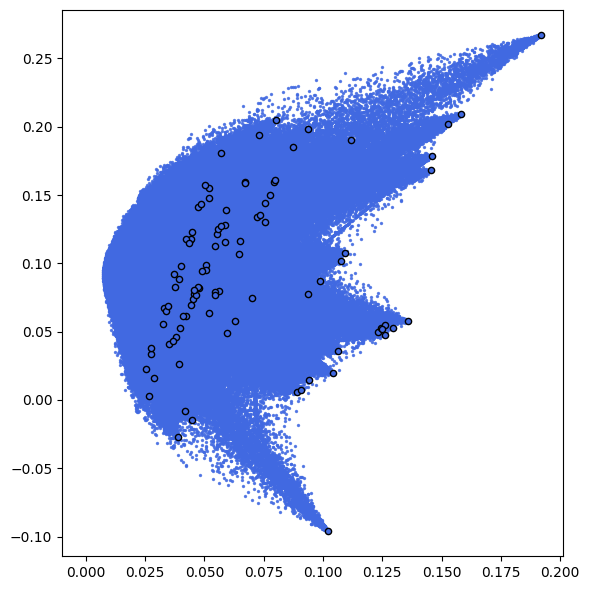

In [14]:
n_sub_min = 1
n_sub_max = int(data_size)
n_rep = 5000
num_port = 1000
n_alpha = 100
alphas = np.geomspace(1e-2, 100.0, n_alpha)
chunk = num_port // n_alpha
out_dir = 'Results/Monte Carlo Sim'

all_returns = []
all_stdevs  = []

for r in tqdm(range(n_rep), desc="Repeating random sub-asset sampling", total=n_rep):
    choices = np.arange(n_sub_min, min(n_sub_max, len(mu)) + 1)
    n_sub_r = np.random.choice(choices)

    idx = np.random.choice(len(mu), n_sub_r, replace=False)
    mu_sub = mu[idx]
    Sigma_sub = Sigma[np.ix_(idx, idx)]

    returns_r, stdevs_r = [], []

    rem = num_port % n_alpha
    for i, alpha in enumerate(alphas):
        size_i = chunk + (1 if i < rem else 0)
        if size_i <= 0:
            continue
        w = np.random.dirichlet(np.full(n_sub_r, alpha), size_i)
        returns_r.append(w @ mu_sub)
        stdevs_r.append(np.sqrt(np.einsum('ij,jk,ik->i', w, Sigma_sub, w)))

    all_returns.extend(returns_r)
    all_stdevs.extend(stdevs_r)

    cum_vol = np.concatenate(all_stdevs)
    cum_ret = np.concatenate(all_returns)

    plt.figure(figsize=(6, 6))
    plt.scatter(cum_vol, cum_ret, s=2, c='royalblue', alpha=0.8)
    plt.scatter(asset_stdevs, asset_returns, facecolors='royalblue', edgecolors='k', linewidths=1, s=20)
    plt.xlim(-0.01,)
    plt.tight_layout()
    plt.savefig(f'{out_dir}/{r:04d}.png', transparent=True, dpi=144)
    plt.close()

In [ ]:
image_folder = "Results/Monte Carlo Sim"
png_files = sorted([os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith('.png')])
frames = []
base = Image.open(png_files[0]).convert("RGBA")

for png_file in tqdm(png_files, desc="Building cumulative GIF"):
    img = Image.open(png_file).convert("RGBA")
    alpha = img.getchannel("A")
    img = img.convert("RGB").convert("P", palette=Image.ADAPTIVE, colors=256, dither=Image.NONE)
    transparency = 255
    for x in range(img.width):
        for y in range(img.height):
            if alpha.getpixel((x, y)) == 0:
                transparency = img.getpixel((x, y))
                break
        if transparency != 255:
            break
    frames.append(img)

frames[0].save('Results/onte Carlo Sim.gif',save_all=True, append_images=frames[1:], duration=30, loop=0, transparency=transparency, disposal=2, optimize=False)